In [3]:
import pandas as pd
import numpy as np
import pickle
from eunjeon import Mecab
import os
import collections
import re
from tqdm import tqdm
import nltk

mecab = Mecab()

In [47]:
with open('./data/201215_ICTlabel.pickle', 'rb') as f:
    labeled_data = pickle.load(f)
    
with open('./word_dic/kisdi_dictionary_201222.pkl', 'rb') as f:
    kis_dic = pickle.load(f) 

In [3]:
def preprocessing(text_list):
    preprocessed_text = []
    for text in text_list:
        text = re.sub(r'\W+', ' ', text)
        text = re.sub('o','', text)
        text = re.sub('○','', text)
        text = re.sub('ㅇ','', text)
        text = mecab.nouns(text)
        preprocessed_text.append(text)
    return preprocessed_text


def preprocessing_1(text):
    text = re.sub(r'\W+', ' ', text)
    text = re.sub('o','', text)
    text = re.sub('○','', text)
    text = re.sub('ㅇ','', text)
    return text


def preprocessing_2(text):
    text = re.sub(r'\W+', ' ', text)
    text = re.sub('o','', text)
    text = re.sub('○','', text)
    text = re.sub('ㅇ','', text)
    text = mecab.nouns(text)
    return text

In [48]:
labeled_data['for drop'] = labeled_data['전체'].apply(lambda text: preprocessing_1(text))
labeled_data = labeled_data.drop_duplicates(['for drop'], keep='first', ignore_index=True)
labeled_data

,index,대분류,중분류,전체,ICT,for drop
0,5,정보/통신,소프트웨어,"지구 과학 연구, 방재, 환경, 기후 변화 등의 분야에서 각종 위성 탑재 센서로부터...",1,지구 과학 연구 방재 환경 기후 변화 등의 분야에서 각종 위성 탑재 센서로부터 산출...
1,6,기계,인공위성,초소형인공위성은 적은 비용과 짧은 개발 기간으로 대학 및 연구소에서 교육 또는 신기...,1,초소형인공위성은 적은 비용과 짧은 개발 기간으로 대학 및 연구소에서 교육 또는 신기...
2,7,정보/통신,광대역 통합망,"o 유럽등 8개국가와 FP7 과제의 공동참여를 통해, 미래인터넷 Federation...",1,유럽등 8개국가와 FP7 과제의 공동참여를 통해 미래인터넷 Federatin 기술...
3,8,물리학,응집물질물리,○ 일본의 대용량 양성자가속기 기반 복합연구시설인 J-PARC 및 관련시설의 이용연...,0,일본의 대용량 양성자가속기 기반 복합연구시설인 J PARC 및 관련시설의 이용연구...
4,9,화학,고분자화학,"본 연구의 목표는 유럽 6개국 (헝가리, 영국, 프랑스, 덴마크, 스웨덴, 노르웨이...",0,본 연구의 목표는 유럽 6개국 헝가리 영국 프랑스 덴마크 스웨덴 노르웨이 과 대한민...
...,...,...,...,...,...,...
185242,287312,교육,교육일반,"인간 존중의 가치관 확립, 더불어 살아가는 품성 함양, 미래사회를 살아가는 지식과 ...",0,인간 존중의 가치관 확립 더불어 살아가는 품성 함양 미래사회를 살아가는 지식과 지혜...
185243,287313,교육,교육일반,WISE-X 교육혁신모델을 토대로 '4차 산업혁명 교육혁신선도대학'.혁신적 학사제도...,0,WISE X 교육혁신모델을 토대로 4차 산업혁명 교육혁신선도대학 혁신적 학사제도 및...
185244,287315,교육,교육일반,"학생 성공을 위한 스마트대학, 창조적으로 도전하는 혁신대학, 글로벌 선도 기업가적 ...",0,학생 성공을 위한 스마트대학 창조적으로 도전하는 혁신대학 글로벌 선도 기업가적 대학...
185245,287316,교육,교육일반,"기독교적 인성교육을 통하여 올바른 가치관과 섬김의 리더십 배양, 기초역량 강화교육을...",0,기독교적 인성교육을 통하여 올바른 가치관과 섬김의 리더십 배양 기초역량 강화교육을 ...


In [49]:
labeled_data.ICT.value_counts()

0    124483
1     60764
Name: ICT, dtype: int64

# Filter words with TTA

In [4]:
tta = pd.read_excel('./word_dic/1_TTA용어사전_KISDI.xls')
tta.shape

(25269, 6)

### *  TTA: 단일어, 단어 내용(설명)에 ICT 단어, KIS 단어

In [53]:
word_list = list(tta[tta['내용'].str.contains('ICT|ict|정보통신|빅데이터|AI|ai|통신망', na=True)]['국문표제어'])
filter_words = [word for word in word_list if word in list(kis_dic.token2id.keys())]
len(filter_words)

69

In [114]:
len(word_list)

1762

In [113]:
word_list = list(tta[tta['내용'].str.contains('ICT|ict|정보통신|빅데이터|AI|ai|통신망', na=True)]['국문표제어'])
filter_words = [word for word in word_list if word in tokenizer.word_docs.keys()]
len(filter_words)

85

In [116]:
# filter_words = list(set(filter_words) | set(filter_words1))
filter_words 

['토큰',
 '블록체인',
 '토폴로지',
 '브로드밴드',
 '루트',
 '자왜',
 '픽셀',
 '패스워드',
 '전자책',
 '인트라넷',
 '구역',
 '워크스테이션',
 '워드프레스',
 '무선랜',
 '연선',
 '집중국',
 '처리율',
 '단말기',
 '텔레포트',
 '전화망',
 '태핑',
 '타조',
 '시스템',
 '대칭',
 '심비안',
 '스팸',
 '솔라리스',
 '소켓',
 '소호',
 '서비스',
 '서버',
 '경로',
 '로밍',
 '래스',
 '펄스열',
 '사유',
 '포스트',
 '평면',
 '핑',
 '동등',
 '파스칼',
 '페인트',
 '온톨로지',
 '네트워크',
 '네티즌',
 '메시지',
 '돌출부',
 '목록',
 '인터넷',
 '추론',
 '식별',
 '허브',
 '홈런',
 '하비',
 '그룹웨어',
 '그리드',
 '게이트웨이',
 '프리웨어',
 '전송',
 '플래그',
 '이더넷',
 '에지',
 '다운사이징',
 '내려받기',
 '디렉터리',
 '데이지',
 '저작권법',
 '통신',
 '클라이언트',
 '회선',
 '암호',
 '채트',
 '채널',
 '연쇄',
 '셀룰러',
 '셀',
 '발호',
 '캐시',
 '버스',
 '방송국',
 '브리지',
 '봇',
 '기간',
 '애니메이션',
 '주소']

In [117]:
remove = ['목록','셀','타조','루트','패스워드', '시스템', '서비스', '돌출부', '구역','스팸','경로','사유',
          '포스트','메시지','네티즌', '대칭', '내려받기', '평면','동등','파스칼','페인트','인터넷','식별','허브'
          ,'홈런','하비','그리드', '전자책','추론','전송','저작권법','데이지','클라이언트','암호','채널','연쇄', '캐시',
          '버스','방송국','회선','기간','애니메이션','주소']
for w in remove:
    if w in filter_words:
        filter_words.remove(w)
    else:
        print(w)

In [118]:
filter_words.extend(['ICT','빅데이터','인공지능','AI','클라우드','IT', '딥러닝','빅 데이터', '통신망', '정보 통신', 'IoT', '대량 데이터','통신 기술','통신기술'])

In [119]:
filter_words

['토큰',
 '블록체인',
 '토폴로지',
 '브로드밴드',
 '자왜',
 '픽셀',
 '인트라넷',
 '워크스테이션',
 '워드프레스',
 '무선랜',
 '연선',
 '집중국',
 '처리율',
 '단말기',
 '텔레포트',
 '전화망',
 '태핑',
 '심비안',
 '솔라리스',
 '소켓',
 '소호',
 '서버',
 '로밍',
 '래스',
 '펄스열',
 '핑',
 '온톨로지',
 '네트워크',
 '그룹웨어',
 '게이트웨이',
 '프리웨어',
 '플래그',
 '이더넷',
 '에지',
 '다운사이징',
 '디렉터리',
 '통신',
 '채트',
 '셀룰러',
 '발호',
 '브리지',
 '봇',
 'ICT',
 '빅데이터',
 '인공지능',
 'AI',
 '클라우드',
 'IT',
 '딥러닝',
 '빅 데이터',
 '통신망',
 '정보 통신',
 'IoT',
 '대량 데이터',
 '통신 기술',
 '통신기술']

In [58]:
def filter_doc(doc):
    filter_true = 0
    for i in filter_words:   
        if i in doc:
            filter_true+=1
    if filter_true > 0 :
        return 1
    else:
        return 0

In [120]:
len(filter_words)

56

In [60]:
labeled_data['filtered_ICT'] = labeled_data['전체'].apply(filter_doc)
labeled_data['cleaned_data'] = labeled_data['전체'].apply(lambda text: nltk.sent_tokenize(text))
labeled_data = labeled_data.drop(['index'], axis=1)
labeled_data.cleaned_data = labeled_data.cleaned_data.apply(preprocessing)
labeled_data

,대분류,중분류,전체,ICT,for drop,filtered_ICT,cleaned_data
0,정보/통신,소프트웨어,"지구 과학 연구, 방재, 환경, 기후 변화 등의 분야에서 각종 위성 탑재 센서로부터...",1,지구 과학 연구 방재 환경 기후 변화 등의 분야에서 각종 위성 탑재 센서로부터 산출...,1,"[[지구, 과학, 연구, 방재, 환경, 기후, 변화, 등, 분야, 각종, 위성, 탑..."
1,기계,인공위성,초소형인공위성은 적은 비용과 짧은 개발 기간으로 대학 및 연구소에서 교육 또는 신기...,1,초소형인공위성은 적은 비용과 짧은 개발 기간으로 대학 및 연구소에서 교육 또는 신기...,1,"[[소형, 인공위성, 비용, 개발, 기간, 대학, 연구소, 교육, 기술, 개발, 사..."
2,정보/통신,광대역 통합망,"o 유럽등 8개국가와 FP7 과제의 공동참여를 통해, 미래인터넷 Federation...",1,유럽등 8개국가와 FP7 과제의 공동참여를 통해 미래인터넷 Federatin 기술...,1,"[[유럽, 등, 개, 국가, 과제, 공동, 참여, 미래, 인터넷, 기술, 확보, 글..."
3,물리학,응집물질물리,○ 일본의 대용량 양성자가속기 기반 복합연구시설인 J-PARC 및 관련시설의 이용연...,0,일본의 대용량 양성자가속기 기반 복합연구시설인 J PARC 및 관련시설의 이용연구...,0,"[[일본, 대용량, 양성자, 속기, 기반, 복합, 연구, 시설, 관련, 시설, 이용..."
4,화학,고분자화학,"본 연구의 목표는 유럽 6개국 (헝가리, 영국, 프랑스, 덴마크, 스웨덴, 노르웨이...",0,본 연구의 목표는 유럽 6개국 헝가리 영국 프랑스 덴마크 스웨덴 노르웨이 과 대한민...,1,"[[연구, 목표, 유럽, 개국, 헝가리, 영국, 프랑스, 덴마크, 스웨덴, 노르웨이..."
...,...,...,...,...,...,...,...
185242,교육,교육일반,"인간 존중의 가치관 확립, 더불어 살아가는 품성 함양, 미래사회를 살아가는 지식과 ...",0,인간 존중의 가치관 확립 더불어 살아가는 품성 함양 미래사회를 살아가는 지식과 지혜...,0,"[[인간, 존중, 가치관, 확립, 품성, 함양, 미래, 사회, 지식, 지혜, 습득,..."
185243,교육,교육일반,WISE-X 교육혁신모델을 토대로 '4차 산업혁명 교육혁신선도대학'.혁신적 학사제도...,0,WISE X 교육혁신모델을 토대로 4차 산업혁명 교육혁신선도대학 혁신적 학사제도 및...,0,"[[교육, 혁신, 모델, 토대, 차, 산업, 혁명, 교육, 혁신, 선도, 대학, 혁..."
185244,교육,교육일반,"학생 성공을 위한 스마트대학, 창조적으로 도전하는 혁신대학, 글로벌 선도 기업가적 ...",0,학생 성공을 위한 스마트대학 창조적으로 도전하는 혁신대학 글로벌 선도 기업가적 대학...,0,"[[학생, 성공, 스마트, 대학, 창조, 도전, 혁신, 대학, 글로벌, 선도, 기업..."
185245,교육,교육일반,"기독교적 인성교육을 통하여 올바른 가치관과 섬김의 리더십 배양, 기초역량 강화교육을...",0,기독교적 인성교육을 통하여 올바른 가치관과 섬김의 리더십 배양 기초역량 강화교육을 ...,1,"[[기독교, 성교육, 가치관, 리더십, 배양, 기초, 역량, 강화, 교육, 논리, ..."


In [61]:
labeled_data.filtered_ICT.value_counts()

0    130516
1     54731
Name: filtered_ICT, dtype: int64

### ICT 분류 재레이블링

In [62]:
type_0 = ['농업기계학','뇌의약','뇌신경생물','뇌공학','뇌인지','기타 뇌과학','분자세포 생물학',
              '자연과학 교과교육','식량작물과학','원예작물과학','식품과학','동물자원과학','식품영양과학']
type_1 = ['영상/음향기기']


new_label = []
for idx in tqdm(labeled_data.index):
    if labeled_data.loc[idx]['중분류'] in type_0:
        new_label.append(0)
    elif labeled_data.loc[idx]['중분류'] in type_1:
        new_label.append(0)
    else:
        new_label.append(labeled_data.loc[idx].ICT)
        
labeled_data['ICT'] = new_label

100%|████████████████████████████████████████████████████████████████████████| 185247/185247 [00:42<00:00, 4384.28it/s]


In [63]:
labeled_data.ICT.value_counts()

0    145610
1     39637
Name: ICT, dtype: int64

In [64]:
labeled_data['for tokenizer'] = labeled_data['for drop'].apply(preprocessing_2)
ict_doc = labeled_data[labeled_data.filtered_ICT == 1] 
non_ict_doc = labeled_data[labeled_data.filtered_ICT == 0]
interest_main_domain = ['과학기술과 인문사회','경제/경영','미디어/커뮤니케이션/문헌정보'] 
interest_mid_domain = ['응용통계'] 
int_dom = ict_doc[ict_doc['대분류'].isin(interest_main_domain)] 
int_dom2 = ict_doc[ict_doc['중분류'].isin(interest_mid_domain)]
ict_doc = ict_doc[ict_doc.ICT == 1]
ict_doc = ict_doc.append(int_dom) 
ict_doc = ict_doc.append(int_dom2)  

ict_doc = ict_doc.drop_duplicates(['for drop'])
ict_doc.head()

,대분류,중분류,전체,ICT,for drop,filtered_ICT,cleaned_data,for tokenizer
0,정보/통신,소프트웨어,"지구 과학 연구, 방재, 환경, 기후 변화 등의 분야에서 각종 위성 탑재 센서로부터...",1,지구 과학 연구 방재 환경 기후 변화 등의 분야에서 각종 위성 탑재 센서로부터 산출...,1,"[[지구, 과학, 연구, 방재, 환경, 기후, 변화, 등, 분야, 각종, 위성, 탑...","[지구, 과학, 연구, 방재, 환경, 기후, 변화, 등, 분야, 각종, 위성, 탑재..."
1,기계,인공위성,초소형인공위성은 적은 비용과 짧은 개발 기간으로 대학 및 연구소에서 교육 또는 신기...,1,초소형인공위성은 적은 비용과 짧은 개발 기간으로 대학 및 연구소에서 교육 또는 신기...,1,"[[소형, 인공위성, 비용, 개발, 기간, 대학, 연구소, 교육, 기술, 개발, 사...","[소형, 인공위성, 비용, 개발, 기간, 대학, 연구소, 교육, 기술, 개발, 사용..."
2,정보/통신,광대역 통합망,"o 유럽등 8개국가와 FP7 과제의 공동참여를 통해, 미래인터넷 Federation...",1,유럽등 8개국가와 FP7 과제의 공동참여를 통해 미래인터넷 Federatin 기술...,1,"[[유럽, 등, 개, 국가, 과제, 공동, 참여, 미래, 인터넷, 기술, 확보, 글...","[유럽, 등, 개, 국가, 과제, 공동, 참여, 미래, 인터넷, 기술, 확보, 글로..."
18,정보/통신,소프트웨어,"본 연구 과제의 목표는 최근 혁신적인 네 가지 IT 기술인 소셜 미디어, 스마트 장...",1,본 연구 과제의 목표는 최근 혁신적인 네 가지 IT 기술인 소셜 미디어 스마트 장치...,1,"[[연구, 과제, 목표, 최근, 혁신, 가지, 기술, 소셜, 미디어, 스마트, 장치...","[연구, 과제, 목표, 최근, 혁신, 가지, 기술, 소셜, 미디어, 스마트, 장치,..."
19,과학기술과 인문사회,과학기술정책/사회,○ KOSEN 네트워크 및 회원 참여도 강화\n\n- 재외한인과학기술자 네트워킹 강...,1,KOSEN 네트워크 및 회원 참여도 강화 재외한인과학기술자 네트워킹 강화 KOSE...,1,"[[네트워크, 회원, 참여, 강화, 외한, 과학, 기술자, 네트, 워킹, 강화, 회...","[네트워크, 회원, 참여, 강화, 외한, 과학, 기술자, 네트, 워킹, 강화, 회원..."


In [65]:
non_ict_doc = non_ict_doc[non_ict_doc.ICT == 0] 
sampled_non_ict_doc = non_ict_doc.sample(n=ict_doc.shape[0], random_state=1000)
sampled_non_ict_doc 

,대분류,중분류,전체,ICT,for drop,filtered_ICT,cleaned_data,for tokenizer
91108,농림수산식품,농생물학,○ 고발현 binary vector 시스템 이용 항균펩타이드 생산 형질전환누에 개발...,0,고발현 binary vectr 시스템 이용 항균펩타이드 생산 형질전환누에 개발 항...,0,"[[발현, 시스템, 이용, 항균, 펩타이드, 생산, 형질전환, 누, 개발, 항균, ...","[발현, 시스템, 이용, 항균, 펩타이드, 생산, 형질전환, 누, 개발, 항균, 펩..."
165561,농림수산식품,원예특용작물과학,대용량 착즙기술 확립을 위한 효소처리 기술 개발\n\n\n단감 퓨레 이송 및 농축 ...,0,대용량 착즙기술 확립을 위한 효소처리 기술 개발 단감 퓨레 이송 및 농축 시스템 개...,0,"[[대용량, 착즙, 기술, 확립, 효소, 처리, 기술, 개발, 단감, 퓨레, 이송,...","[대용량, 착즙, 기술, 확립, 효소, 처리, 기술, 개발, 단감, 퓨레, 이송, ..."
47768,재료,세라믹재료,광계1과 반도체 물질의 결합을 통한 인공적 전자 전달 시스템의 구현 광계1과 반도체...,0,광계1과 반도체 물질의 결합을 통한 인공적 전자 전달 시스템의 구현 광계1과 반도체...,0,"[[광계, 반도체, 물질, 결합, 인공, 전자, 전달, 시스템, 구현, 광, 반도체...","[광계, 반도체, 물질, 결합, 인공, 전자, 전달, 시스템, 구현, 광, 반도체,..."
92057,농림수산식품,식량작물과학,"맥류 유전자원의 수집과 관리, 특성조사 및 학술적&#8226;산업적 이용이 가능한 ...",0,맥류 유전자원의 수집과 관리 특성조사 및 학술적 8226 산업적 이용이 가능한 자원...,0,"[[맥류, 유전자원, 수집, 관리, 특성, 조사, 학술, 산업, 이용, 가능, 자원...","[맥류, 유전자원, 수집, 관리, 특성, 조사, 학술, 산업, 이용, 가능, 자원,..."
179381,농림수산식품,식품과학,？ 서구 선진국에서 가장 빈번한 식중독 원인균으로 알려진 캠필로박터에 의한 감염이 ...,0,서구 선진국에서 가장 빈번한 식중독 원인균으로 알려진 캠필로박터에 의한 감염이 최...,0,"[[서구, 선진국, 식중독, 원인, 균, 캠필로, 박, 터, 감염, 최근, 국내, ...","[서구, 선진국, 식중독, 원인, 균, 캠필로, 박, 터, 감염, 최근, 국내, 속..."
...,...,...,...,...,...,...,...,...
153867,에너지/자원,기타 에너지/자원,◎ 개발 목표\n\n\n\n\n\n 1) GPR 및 전자기탐사(RD 등) ...,0,개발 목표 1 GPR 및 전자기탐사 RD 등 기법으로 3m 깊이의 다중 매설배관 ...,0,"[[개발, 목표, 전자기, 탐사, 등, 기법, 깊이, 다중, 매설, 배관, 위치, ...","[개발, 목표, 전자기, 탐사, 등, 기법, 깊이, 다중, 매설, 배관, 위치, 좌..."
35431,화학,고분자화학,"본 연구에서는 유기반도체의 성능 향상을 위한 신규물질을 개발하고, 전하이동 면에서 ...",0,본 연구에서는 유기반도체의 성능 향상을 위한 신규물질을 개발하고 전하이동 면에서 고...,0,"[[연구, 유기, 반도체, 성능, 향상, 신규, 물질, 개발, 전하, 이동, 면, ...","[연구, 유기, 반도체, 성능, 향상, 신규, 물질, 개발, 전하, 이동, 면, 고..."
29944,농림수산식품,식품과학,1. 소화율 개선 소재 개발(육류) 및 동물 모델을 이용한 시제품의 소화율 및 특성...,0,1 소화율 개선 소재 개발 육류 및 동물 모델을 이용한 시제품의 소화율 및 특성 평...,0,"[[], [소화, 개선, 소재, 개발, 육류, 동물, 모델, 이용, 시제품, 소화,...","[소화, 개선, 소재, 개발, 육류, 동물, 모델, 이용, 시제품, 소화, 특성, ..."
168867,농림수산식품,농수축산물 안전,물리적 기반 하에서 살포농약의 지하수 및 토양과 같은 농업 환경 내 거동 예측 모델...,0,물리적 기반 하에서 살포농약의 지하수 및 토양과 같은 농업 환경 내 거동 예측 모델...,0,"[[물리, 기반, 살포, 농약, 지하수, 토양, 농업, 환경, 내, 거동, 예측, ...","[물리, 기반, 살포, 농약, 지하수, 토양, 농업, 환경, 내, 거동, 예측, 모..."


In [69]:
non_ict_doc.shape

(113800, 8)

In [70]:
ict_doc.shape

(23592, 8)

In [66]:
import plotly.express as px

ict = ict_doc.groupby(['대분류','중분류']).count().reset_index()
non_ict = sampled_non_ict_doc.groupby(['대분류','중분류']).count().reset_index() 


fig = px.pie(ict ,names='대분류', values='filtered_ICT', title='ICT doc')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show() 

fig = px.pie(non_ict ,names='대분류', values='filtered_ICT', title='non ICT doc')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

In [67]:
new_data = ict_doc.append(sampled_non_ict_doc) 

In [68]:
new_data.filtered_ICT.value_counts()

1    23592
0    23592
Name: filtered_ICT, dtype: int64

# HAN for classification

In [23]:
from collections import defaultdict
import re 
import sys
import os 
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

from keras.preprocessing.text import Tokenizer, text_to_word_sequence
from keras.preprocessing.sequence import pad_sequences
from keras.utils.np_utils import to_categorical

from keras.layers import Embedding
from keras.layers import Dense, Input, Flatten, Activation 
from keras.layers import Conv1D, MaxPooling1D, merge, Dropout, LSTM, GRU, Bidirectional, TimeDistributed
from keras.callbacks import EarlyStopping
from keras.models import Model 

from keras import optimizers
from keras import backend as K
from keras.engine.topology import Layer, InputSpec
from keras import initializers as initializers, regularizers, constraints

max_sent_length= 100 # 문장 내 최대 단어 수 
max_sentences = 30  # 문서 내 최대 문장 수 
max_words_dic = 20000
embedding_dim = 50 
validation_split = 0.2 
adam = optimizers.Adam(lr=0.001) 

In [71]:
texts = list(new_data['for tokenizer']) 
documents = list(new_data.cleaned_data)
labels = pd.get_dummies(new_data.filtered_ICT, prefix='filtered_ICT')


In [72]:
# 모르는 단어는 1로 들어감
tokenizer = Tokenizer(num_words=max_words_dic, lower=False, oov_token="<OOV>")
tokenizer.fit_on_texts(texts)
word_dic = tokenizer.word_index
data = np.zeros((len(texts), max_sentences, max_sent_length), dtype='int32') 
data.shape

(47184, 30, 100)

In [73]:
# 데이터 구성 : [문서, 문장, 단어]
for i, sentences in tqdm(enumerate(documents)): # 문장 집합으로 표현된 하나의 문서를 뽑아서
    for j, sentence in enumerate(sentences): # 그 문서집합 내의 문장들을 하나씩 뽑고 
        if j < max_sentences:
            wordTokens = text_to_word_sequence(str(sentence))
            k = 0 
            for _, word in enumerate(wordTokens):
                try:
                    word = eval(word)
                    if k < max_sent_length :
                        if word not in tokenizer.word_index:
                            continue
                        if tokenizer.word_index[word] < max_sent_length:
                            data[i,j,k] = tokenizer.word_index[word]
                            k+=1
                    
                except SyntaxError:
                    print(word)
                    if k < max_sent_length :
                        if word not in tokenizer.word_index:
                            continue
                        if tokenizer.word_index[word] < max_sent_length:
                            data[i,j,k] = tokenizer.word_index[word]
                            k+=1
  

4730it [00:13, 316.95it/s]

'내셔날
'
'내셔날
'
'내셔날
'


5519it [00:16, 277.86it/s]

'콜라비
'
'콜라비
'


12655it [00:39, 334.89it/s]

'내셔날
'
'내셔날
'


14756it [00:46, 316.04it/s]

'내셔날
'
'내셔날
'


17749it [00:55, 296.24it/s]

'내셔날
'


18817it [00:59, 251.57it/s]

'내셔날
'
'내셔날
'


29141it [01:28, 414.91it/s]

'에듀
'
'에듀
'
'에듀
'
'에듀
'


38924it [01:51, 395.88it/s]

'콜라비
'


39179it [01:52, 406.11it/s]

'콜라비
'
'콜라비
'


44413it [02:05, 415.00it/s]

'내셔날
'


47184it [02:11, 358.57it/s]


In [74]:
def dot_product(x, kernel):
    return K.squeeze(K.dot(x, K.expand_dims(kernel)), axis=-1)


class AttentionWithContext(Layer):
    def __init__(self, W_regularizer=None, u_regularizer=None, b_regularizer=None,
                W_constraint=None, u_constraint=None, b_constraint=None, bias=True, **kwargs):
        
        self.supports_masking = True
        self.init = initializers.get('glorot_uniform')
        
        self.W_regularizer = regularizers.get(W_regularizer)
        self.u_regularizer = regularizers.get(u_regularizer)
        self.b_regularizer = regularizers.get(b_regularizer)
        
        self.W_constraint = constraints.get(W_constraint)
        self.u_constraint = constraints.get(u_constraint)
        self.b_constraint = constraints.get(b_constraint)
        
        self.bias = bias 
        super(AttentionWithContext, self).__init__(**kwargs)
        
    def build(self, input_shape):
        assert len(input_shape) == 3
        self.W = self.add_weight(shape=(input_shape[-1], input_shape[-1],),
                                initializer=self.init, 
                                name='{}_W'.format(self.name),
                                regularizer=self.W_regularizer,
                                constraint=self.W_constraint)
        if self.bias:
            self.b = self.add_weight(shape=(input_shape[-1],),
                                    initializer=self.init, 
                                    name='{}_b'.format(self.name),
                                    regularizer=self.b_regularizer,
                                    constraint=self.b_constraint)
        self.u = self.add_weight(shape=(input_shape[-1],),
                                initializer=self.init,
                                name='{}_u'.format(self.name),
                                regularizer=self.u_regularizer,
                                constraint=self.u_constraint)

        super(AttentionWithContext, self).build(input_shape)

    def compute_mask(self, input, input_mask=None):
        return None
    
    def call(self, x, mask=None):
        uit = dot_product(x, self.W)
        if self.bias:
            uit += self.b
        
        uit = K.tanh(uit)
        ait = dot_product(uit, self.u)
        
        a = K.exp(ait)
        a /= K.cast(K.sum(a, axis=1, keepdims=True)+K.epsilon(), K.floatx())
        
        a = K.expand_dims(a)
        weighted_input = x * a
        return K.sum(weighted_input, axis=1)
    
    def compute_output_shape(self, input_shape):
        return input_shape[0], input_shape[-1]
    


In [75]:
x_train, x_test, y_train, y_test = train_test_split(data, labels, test_size=0.2, random_state=100, stratify=labels)
x_train, x_valid, y_train, y_valid = train_test_split(x_train, y_train, test_size=0.2, random_state=200, stratify=y_train)
print(x_train.shape)
print(x_test.shape)
print(x_valid.shape)
print('Number of samples of each class in training and validation set')
print(y_train.sum(axis=0))
print(y_valid.sum(axis=0)) 


data_X = [x_train, x_valid, x_test] 
data_y = [y_train, y_valid, y_test] 
train_idx, valid_idx, test_idx = y_train.index, y_valid.index, y_test.index

(30197, 30, 100)
(9437, 30, 100)
(7550, 30, 100)
Number of samples of each class in training and validation set
filtered_ICT_0    15099
filtered_ICT_1    15098
dtype: int64
filtered_ICT_0    3775
filtered_ICT_1    3775
dtype: int64


### Training HAN

In [76]:
def run_model(data_x, data_y, max_sentences, max_sent_length):
    # 데이터
    x_train, x_valid, x_test = data_X[0], data_X[1], data_X[2]
    y_train, y_valid, y_test = data_y[0], data_y[1], data_y[2] 

    embedding_layer = Embedding(len(tokenizer.word_index)+1, embedding_dim,
                                input_length=max_sent_length, trainable=True)
    
    # 모델
    word_input = Input(shape=(max_sent_length,), dtype='int32')  #(100 단어,)
    word_sequences = embedding_layer(word_input) 
    word_lstm = Bidirectional(GRU(100, return_sequences=True))(word_sequences)
    # return_sequence = True : 중간 hidden vector를 사용하겠다는 뜻!
    word_dense = TimeDistributed(Dense(200))(word_lstm)
    # TimeDistributed: 각 스텝마다 cost를 계산해서 하위 스텝으로 cost 전파 -> weight를 업데이트
    word_att = AttentionWithContext()(word_dense)
    wordEncoder = Model(word_input, word_att)
    
    #(30문장, 100개의 단어)
    sent_input = Input(shape=(max_sentences, max_sent_length), dtype='int32')
    sent_encoder = TimeDistributed(wordEncoder)(sent_input)
    sent_lstm = Bidirectional(GRU(100, return_sequences=True))(sent_encoder)
    sent_dense = TimeDistributed(Dense(200))(sent_lstm)
    sent_att = AttentionWithContext()(sent_dense)
    latent_representation_of_doc = Dense(3)(sent_att)
    predictions = Dense(2, activation='softmax')(sent_att)
    model = Model(sent_input, predictions)
    Encoder = Model(sent_input, latent_representation_of_doc)
    
    model.compile(loss ='categorical_crossentropy', 
                 optimizer = adam,
                 metrics = ['acc'])
    
    print(model.summary())
    
    es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=3)
    history = model.fit(x_train, y_train, validation_data=(x_valid, y_valid),
                       epochs=2, batch_size=50, callbacks=[es])
    
    loss, acc = model.evaluate(x_train, y_train, verbose=2)
    print('Training Acc: {:.4f}'.format(acc))
    
    loss, acc = model.evaluate(x_test, y_test, verbose=2)
    print('Testing Acc: {:.4f}'.format(acc))
    
    #y_pred = np.argmax(model.predict(x_test), axis=1) +1
    #cm = confusion_matrix(y_test, y_pred, labels=None, sample_weight=None)
    
    return model, Encoder, history
        

In [77]:
model, Encoder, history = run_model(data_X, data_y, max_sentences, max_sent_length) 

Model: "model_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 30, 100)]         0         
_________________________________________________________________
time_distributed_4 (TimeDist (None, 30, 200)           2744500   
_________________________________________________________________
bidirectional_3 (Bidirection (None, 30, 200)           181200    
_________________________________________________________________
time_distributed_5 (TimeDist (None, 30, 200)           40200     
_________________________________________________________________
attention_with_context_3 (At (None, 200)               40400     
_________________________________________________________________
dense_7 (Dense)              (None, 2)                 402       
Total params: 3,006,702
Trainable params: 3,006,702
Non-trainable params: 0
_________________________________________________

In [78]:
y_pred = np.argmax(model.predict(data), axis=1) 
ict_prob = model.predict(data)[:,1]

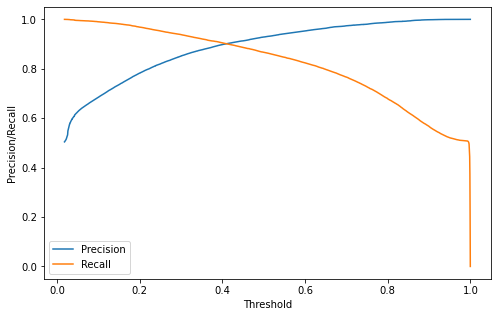

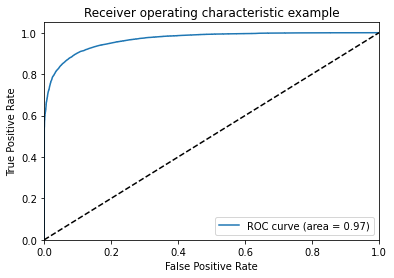

In [79]:
from sklearn.metrics import precision_recall_curve
from sklearn import metrics
import matplotlib.pyplot as plt
precision_rt, recall_rt, threshold_rt = precision_recall_curve(labels.filtered_ICT_1, ict_prob)
fpr, tpr, thresholds = metrics.roc_curve(labels.filtered_ICT_1, ict_prob)
roc_auc = metrics.auc(fpr, tpr)

plt.figure(figsize=(8,5))
plt.plot(threshold_rt, precision_rt[1:], label='Precision')
plt.plot(threshold_rt, recall_rt[1:], label='Recall')
plt.xlabel('Threshold'); plt.ylabel('Precision/Recall') 
plt.legend() 
plt.show() 

plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show() 

In [80]:
# best position of threshold
index_cnt = [cnt for cnt, (p, r) in enumerate(zip(precision_rt, recall_rt)) if p==r][0]
print('precision: ',precision_rt[index_cnt],', recall: ',recall_rt[index_cnt])

# fixed Threshold
threshold_fixed = threshold_rt[index_cnt]
print('threshold: ',threshold_fixed) 

precision:  0.901322482197355 , recall:  0.901322482197355
threshold:  0.41052917


In [81]:
from sklearn.metrics import classification_report, confusion_matrix

pred_y = [ 1 if e> threshold_fixed else 0 for e in ict_prob]
print(classification_report(labels.filtered_ICT_1, pred_y))  
print(confusion_matrix(labels.filtered_ICT_1, pred_y)) 


              precision    recall  f1-score   support

           0       0.90      0.90      0.90     23592
           1       0.90      0.90      0.90     23592

    accuracy                           0.90     47184
   macro avg       0.90      0.90      0.90     47184
weighted avg       0.90      0.90      0.90     47184

[[21265  2327]
 [ 2328 21264]]


In [122]:
from sklearn.metrics import classification_report, confusion_matrix

pred_y = [ 1 if e> 0.5 else 0 for e in ict_prob]
print(classification_report(labels.filtered_ICT_1, pred_y))  
print(confusion_matrix(labels.filtered_ICT_1, pred_y)) 


              precision    recall  f1-score   support

           0       0.87      0.93      0.90     23592
           1       0.93      0.87      0.90     23592

    accuracy                           0.90     47184
   macro avg       0.90      0.90      0.90     47184
weighted avg       0.90      0.90      0.90     47184

[[22021  1571]
 [ 3148 20444]]


In [84]:
labels['predicted'] = y_pred
result_df = pd.merge(labels, new_data, left_index=True, right_index=True, how='left')
result_df.drop(['filtered_ICT_0','filtered_ICT_1','cleaned_data','for tokenizer'], axis=1, inplace=True)
result_df['ICT_prob'] = ict_prob
result_df = result_df.sort_values(by='ICT_prob', ascending=False)
result_df

,predicted,대분류,중분류,전체,ICT,for drop,filtered_ICT,ICT_prob
19280,1,정보/통신,정보보호,● 다음과 같은 인증방법의 기술적 요건을 충족하는 인증 절차를 개발함\n- (비밀정...,1,다음과 같은 인증방법의 기술적 요건을 충족하는 인증 절차를 개발함 비밀정보 추측 ...,1,0.999799
104544,1,정보/통신,정보보호,"① 정성적 목표 \n\n\n [과제명] 『S-ID/N-PW(Single ID, N...",1,① 정성적 목표 과제명 S ID N PW Single ID N Passwrd 기반의...,1,0.999797
146200,1,정보/통신,기타 정보/통신,？아동용 캐릭터신발과 ICT 융합 게임기능 개발을 통한 첨단 기능의 미래형 웨어러블...,1,아동용 캐릭터신발과 ICT 융합 게임기능 개발을 통한 첨단 기능의 미래형 웨어러블...,1,0.999795
119891,1,정보/통신,소프트웨어,o IoT Gateway 장비에서 실행 가능한 실시간 이벤트 처리를 위한 CQL(C...,1,IT Gateway 장비에서 실행 가능한 실시간 이벤트 처리를 위한 CQL Cnt...,1,0.999788
174048,1,정보/통신,소프트웨어,(1) 하이브리드 이용 안드로이드앱 개발\n\n\n 모바일 웹 + 안드로이드 시...,1,1 하이브리드 이용 안드로이드앱 개발 모바일 웹 안드로이드 시스템을 이용한 하이브...,1,0.999788
...,...,...,...,...,...,...,...,...
126155,0,화학,전기화학,"첫째, 이 과제는 3년에 걸친 연구를 통해, 최종적으로는 아직까지 한 번도 보고되지...",0,첫째 이 과제는 3년에 걸친 연구를 통해 최종적으로는 아직까지 한 번도 보고되지 않...,0,0.009724
161776,0,생명과학,발생/신경생물학,본 연구과제의 연구목표는 꼬마선충의 생식선에서 생식세포사멸을 유도하는 장내스트레스의...,0,본 연구과제의 연구목표는 꼬마선충의 생식선에서 생식세포사멸을 유도하는 장내스트레스의...,0,0.009177
89790,0,뇌과학,뇌신경생물,Dendritic spine은 dendrite에서 돌출된 가시구조로 input ne...,0,Dendritic spine은 dendrite에서 돌출된 가시구조로 input ne...,0,0.008927
61900,0,보건의료,의약품/의약품개발,"백혈병 세포는 환경적인 요인이 좋을때 세포 분열을 하지만, 영양분 또는 산소 등이 ...",0,백혈병 세포는 환경적인 요인이 좋을때 세포 분열을 하지만 영양분 또는 산소 등이 부...,0,0.007982


In [136]:
#result_df = result_df.sort_values(by='ICT_prob', ascending=True)
result_df[['전체', 'ICT_prob', 'filtered_ICT']][:25]

,전체,ICT_prob,filtered_ICT
182312,지난 세기 초반 세포 융합이 처음으로 보고된 이래로 그 생성 기전과 암 진화와의 연...,0.007489,0
61900,"백혈병 세포는 환경적인 요인이 좋을때 세포 분열을 하지만, 영양분 또는 산소 등이 ...",0.007982,0
89790,Dendritic spine은 dendrite에서 돌출된 가시구조로 input ne...,0.008927,0
161776,본 연구과제의 연구목표는 꼬마선충의 생식선에서 생식세포사멸을 유도하는 장내스트레스의...,0.009177,0
126155,"첫째, 이 과제는 3년에 걸친 연구를 통해, 최종적으로는 아직까지 한 번도 보고되지...",0.009724,0
21392,본 연구의 최종 목표는 기존에 뇌신경 세포 재생에 효과가 있다고 알려진 저출력 레이...,0.009760,0
161501,신경 손상 후 만성적인 신경병증성 통증의 발현은 신경계의 활성의 변화뿐만 아니라 면...,0.009808,0
89053,원 발암유전자이며 작은 G-proteins인 Ras 단백질은 주화성이나 주전성과 같...,0.009907,0
162990,본 연구는 소장 내분비세포들의 분화 조절과 생리적 기능간의 상호 작용을 분석함으로써...,0.009936,0
180936,"제 1형 CD4 양성 T 세포(CD4+ T helper type 1, TH1 cel...",0.009939,0


In [ ]:
result_df[result_df.ICT_prob > threshold_fixed].sort_values(by='ICT_prob')[:30]

In [91]:
import plotly.figure_factory as ff
group_labels = result_df['대분류'].unique()
hist_data = []
for Type in group_labels:
    hist_data.append(result_df[result_df['대분류'] == Type].ICT_prob.values)
    
fig = ff.create_distplot(hist_data=hist_data[:-10], group_labels=list(group_labels)[:-10])
fig.show()
    

In [92]:
px.histogram(result_df.ICT_prob, marginal='box',
            title='NTIS test ICT document probability ')

## Test News

In [86]:
news_df = pd.read_csv('./data/최종본_KBS_2017.csv')
news_df = news_df.drop_duplicates(['content'])
news = news_df[['content']] 

In [87]:
def preprocessing(text_list):
    preprocessed_text = []
    for text in text_list:
        text = re.sub(r'\W+', ' ', text)
        text = re.sub('o','', text)
        text = re.sub('○','', text)
        text = re.sub('ㅇ','', text)
        text = mecab.nouns(text)
        preprocessed_text.append(text)
    return preprocessed_text



In [88]:
news.content = news.content.apply(lambda text: nltk.sent_tokenize(text))
news.content = news.content.apply(preprocessing) 
news

C:\Users\kiki\Anaconda3\lib\site-packages\pandas\core\generic.py:5168: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,content
0,"[[앵커, 트, 치열, 경쟁, 미래, 앞, 우리, 청년, 삶], [이, 건, 긍정,..."
1,"[[앵커, 트, 이번, 곳, 철강, 생산, 현장, 연결], [포항, 제철소, 김수영..."
2,"[[앵커, 트, 새해, 첫날, 해, 기원, 소망, 다짐, 가슴, 분], [서울, 광..."
3,"[[앵커, 트, 지금, 우리, 경제, 주력, 산업, 도약, 현장, 이번, 앞, 우리..."
4,"[[앵커, 트, 최문종, 오프닝, 공, 웅조, 이곳, 서울, 명동], [시간, 가족..."
...,...
7493,"[[년, 마지막], [이제, 올해, 시간], [새해, 첫날, 내일, 해돋이, 계획,..."
7494,"[[앵커, 트, 올해, 마지막, 날, 오늘, 광주, 아파트, 아이, 명, 사고], ..."
7495,"[[올해, 마지막, 날], [밤, 사이, 눈, 비, 미세먼지, 농도, 대기], [수..."
7496,"[[앵커, 트, 올해, 마지막, 날, 광주, 아파트, 아이, 명, 사고], [아이,..."


In [89]:
data = np.zeros((len(news), max_sentences, max_sent_length), dtype='int32') 
documents = list(news.content)


for i, sentences in tqdm(enumerate(documents)):
    for j, sentence in enumerate(sentences): 
        if j < max_sentences:
            wordTokens = text_to_word_sequence(str(sentence))
            k = 0 
            for _, word in enumerate(wordTokens):
                try:
                    word = eval(word)
                    if k < max_sent_length :
                        if word not in tokenizer.word_index:
                            continue
                        if tokenizer.word_index[word] < max_sent_length:
                            data[i,j,k] = tokenizer.word_index[word]
                            k+=1
                    
                except SyntaxError:
                    print(word)
                    if k < max_sent_length :
                        if word not in tokenizer.word_index:
                            continue
                        if tokenizer.word_index[word] < max_sent_length:
                            data[i,j,k] = tokenizer.word_index[word]
                            k+=1

6229it [00:08, 766.90it/s]


In [90]:
Ict_prob = model.predict(data)
news['ICT_prob'] = Ict_prob[:,1]
news['original_news'] = news_df.content
news = news.sort_values(by='ICT_prob',ascending=True)
news

<ipython-input-90-324eb44d72e4>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-90-324eb44d72e4>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,content,ICT_prob,original_news
5248,"[[앵커, 트, 명, 창원터널, 앞, 폭발, 사고, 과적, 법규, 위반, 피해, 것...",0.018784,<앵커 멘트> 세 명이 숨진 창원터널 앞 폭발 사고는 `과적`과 `법규 위반`이 피...
1681,"[[앵커, 트, 군, 최근, 문제, 공관, 병, 갑, 관련, 사례, 전수, 조사, ...",0.018869,<앵커 멘트> 군은 최근 문제가 된 이른바 공관병에 대한 '갑질'과 관련해 유사한 ...
4305,"[[앵커, 트, 실종, 여중, 피살, 사건, 관련, 경찰, 핵심, 피의자, 대, 이...",0.019162,<앵커 멘트> 실종 여중생 피살사건과 관련해 경찰이 핵심 피의자인 30대 이 모 씨...
3463,"[[앵커, 트, 생리대, 유해성, 논란, 시험, 결과, 처, 시민, 단체, 업체, ...",0.019320,"<앵커 멘트> 생리대 유해성 논란을 불러온 시험 결과를 놓고 식약처와 시민단체, 업..."
3419,"[[앵커, 트, 생리대, 유해성, 논란, 시험, 결과, 처, 시민, 단체, 업체, ...",0.019320,"<앵커 멘트> 생리대 유해성 논란을 불러온 시험 결과를 놓고 식약처와 시민단체, 업..."
...,...,...,...
5267,"[[앵커, 트, 정부, 자치, 단체, 농업, 첨단, 과학, 기술, 접목, 지원], ...",0.999498,<앵커 멘트> 정부와 자치단체들이 농업에 첨단 과학기술을 접목하기 위해 다양한 지원...
5170,"[[앵커, 트, 정부, 자치, 단체, 농업, 첨단, 과학, 기술, 접목, 지원, 동...",0.999498,<앵커 멘트> 정부와 자치단체들이 농업에 첨단 과학기술을 접목하기 위해 다양한 지원...
6088,"[[대학생, 소프트웨어, 창작, 지원, 과학, 기술, 정보, 통신부, 정보, 통신,...",0.999541,대학생들의 소프트웨어 창작을 지원하기 위해 과학기술정보통신부와 정보통신기술진흥센터가...
2412,"[[다음, 달, 일, 휴대, 전화, 통신, 요금, 선택, 약정, 할인, 현행, 상향...",0.999579,다음 달 15일부터 휴대전화 통신요금 선택약정할인율이 현행 20%에서 25%로 상향...


In [143]:
news = news.sort_values(by='ICT_prob',ascending=False)
news[['original_news','ICT_prob']][:25]

,original_news,ICT_prob
5601,2018 평창 동계올림픽에서 구현될 정보통신기술을 미리 체험할 수 있는 '스마트 I...,0.999609
2412,다음 달 15일부터 휴대전화 통신요금 선택약정할인율이 현행 20%에서 25%로 상향...,0.999579
6088,대학생들의 소프트웨어 창작을 지원하기 위해 과학기술정보통신부와 정보통신기술진흥센터가...,0.999541
5170,<앵커 멘트> 정부와 자치단체들이 농업에 첨단 과학기술을 접목하기 위해 다양한 지원...,0.999498
5267,<앵커 멘트> 정부와 자치단체들이 농업에 첨단 과학기술을 접목하기 위해 다양한 지원...,0.999498
6753,"방송통신위원회는 KBS, MBC, SBS 등 지상파 3사에 평창동계올림픽 중계방송에...",0.999495
3167,"SK텔레콤과 KT, LG유플러스 등 이동통신 3사가 정부의 이동통신 약정요금할인율 ...",0.999487
6109,"감사원은 오늘, KBS 이사진이 업무추진비를 부당하게 사용했다면서, 10명의 이사에...",0.999487
1257,국정기획자문위원회는 미래창조과학부가 통신 기본료 폐지 문제에 대해 구체적인 방안을 ...,0.999460
6183,방송통신위원회는 오늘(27일) 전체회의를 열고 포항시내 지진 피해 가구에 대해 2개...,0.999458


In [146]:
len(news[news.ICT_prob < threshold_fixed])

6035

In [145]:
news[news.ICT_prob < threshold_fixed][['original_news','ICT_prob']][:30]

,original_news,ICT_prob
6944,<앵커 멘트> 일본에서는 빨래방 경쟁이 갈수록 치열해지면서 고객 유치를 위해 다양한...,0.407910
3593,<앵커 멘트> 역대 최장 황금 연휴를 맞아 전국 고속도로 통행료가 3일 간 면제되고...,0.407781
6865,<앵커 멘트> 65세 이상 무주택 노인을 위한 '효도 아파트'가 전국에서 처음으로 ...,0.403714
2834,<앵커 멘트> 올 가을은 최첨단 기능으로 무장한 고급 스마트폰이 한바탕 격돌을 벌이...,0.401611
2798,<앵커 멘트> 올 가을은 최첨단 기능으로 무장한 고급 스마트폰이 한바탕 격돌을 벌이...,0.401611
2755,<앵커 멘트> 올 가을은 최첨단 기능으로 무장한 고급 스마트폰이 한바탕 격돌을 벌이...,0.401611
1425,<앵커 멘트> 오늘(10일) 열린 원세훈 전 국정원장의 대선 개입 의혹 재판에서 사...,0.400025
3607,<앵커 멘트> 역대 최장 황금 연휴를 맞아 전국 고속도로 통행료가 3일 간 면제되고...,0.399150
6466,<앵커 멘트> 요즘 일본에서는 도서관이 이용객을 늘리기 위해 다양한 서비스를 제공하...,0.399097
6510,<앵커 멘트> 요즘 일본에서는 도서관이 이용객을 늘리기 위해 다양한 서비스를 제공하...,0.399097


In [ ]:
news = news.sort_values(by='ICT_prob',ascending=True)
news[['original_news','ICT_prob']][:25]

In [98]:
px.histogram(news.ICT_prob, marginal='box',
            title='News ICT document probability ')